In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#pip install -U scikit-learn

In [76]:
# https://www.kaggle.com/muonneutrino/us-census-demographic-data
census = pd.read_csv('acs2015_county_data.csv')
pd.set_option("display.max_rows", None, "display.max_columns", None)
census.head()

,CensusId,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,1001,Alabama,Autauga,55221,26745,28476,2.6,75.8,18.5,0.4,1.0,0.0,40725,51281.0,2391.0,24974,1080,12.9,18.6,33.2,17.0,24.2,8.6,17.1,87.5,8.8,0.1,0.5,1.3,1.8,26.5,23986,73.6,20.9,5.5,0.0,7.6
1,1003,Alabama,Baldwin,195121,95314,99807,4.5,83.1,9.5,0.6,0.7,0.0,147695,50254.0,1263.0,27317,711,13.4,19.2,33.1,17.7,27.1,10.8,11.2,84.7,8.8,0.1,1.0,1.4,3.9,26.4,85953,81.5,12.3,5.8,0.4,7.5
2,1005,Alabama,Barbour,26932,14497,12435,4.6,46.2,46.7,0.2,0.4,0.0,20714,32964.0,2973.0,16824,798,26.7,45.3,26.8,16.1,23.1,10.8,23.1,83.8,10.9,0.4,1.8,1.5,1.6,24.1,8597,71.8,20.8,7.3,0.1,17.6
3,1007,Alabama,Bibb,22604,12073,10531,2.2,74.5,21.4,0.4,0.1,0.0,17495,38678.0,3995.0,18431,1618,16.8,27.9,21.5,17.9,17.8,19.0,23.7,83.2,13.5,0.5,0.6,1.5,0.7,28.8,8294,76.8,16.1,6.7,0.4,8.3
4,1009,Alabama,Blount,57710,28512,29198,8.6,87.9,1.5,0.3,0.1,0.0,42345,45813.0,3141.0,20532,708,16.7,27.2,28.5,14.1,23.9,13.5,19.9,84.9,11.2,0.4,0.9,0.4,2.3,34.9,22189,82.0,13.5,4.2,0.4,7.7


In [77]:
census.dtypes

CensusId             int64
State               object
County              object
TotalPop             int64
Men                  int64
Women                int64
Hispanic           float64
White              float64
Black              float64
Native             float64
Asian              float64
Pacific            float64
Citizen              int64
Income             float64
IncomeErr          float64
IncomePerCap         int64
IncomePerCapErr      int64
Poverty            float64
ChildPoverty       float64
Professional       float64
Service            float64
Office             float64
Construction       float64
Production         float64
Drive              float64
Carpool            float64
Transit            float64
Walk               float64
OtherTransp        float64
WorkAtHome         float64
MeanCommute        float64
Employed             int64
PrivateWork        float64
PublicWork         float64
SelfEmployed       float64
FamilyWork         float64
Unemployment       float64
d

In [78]:
census.describe()

,CensusId,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
count,3220.000000,3.220000e+03,3.220000e+03,3.220000e+03,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3.220000e+03,3219.000000,3219.000000,3220.000000,3220.000000,3220.000000,3219.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000,3.220000e+03,3220.000000,3220.000000,3220.000000,3220.000000,3220.000000
mean,31393.605280,9.940935e+04,4.889694e+04,5.051241e+04,11.011522,75.428789,8.665497,1.723509,1.229068,0.082733,6.993507e+04,46129.868903,2850.395464,23981.771739,1362.518944,17.493261,24.180801,30.990621,18.346398,22.215807,12.714099,15.733385,79.181925,10.278758,0.971832,3.323509,1.612733,4.631770,23.278758,4.559352e+04,74.219348,17.560870,7.931801,0.288106,8.094441
std,16292.078954,3.193055e+05,1.566813e+05,1.626620e+05,19.241380,22.932890,14.279122,7.253115,2.633079,0.734931,2.051189e+05,12911.297940,1918.942273,6204.339960,1049.875689,8.317883,11.698329,6.368379,3.635764,3.199682,4.216784,5.736308,7.657972,2.907897,3.059019,3.756096,1.670988,3.178772,5.600466,1.496995e+05,7.863188,6.510354,3.914974,0.455137,4.096114
min,1001.000000,8.500000e+01,4.200000e+01,4.300000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000e+01,10499.000000,270.000000,5878.000000,113.000000,1.400000,0.000000,13.500000,5.000000,4.100000,1.700000,0.000000,5.200000,0.000000,0.000000,0.000000,0.000000,0.000000,4.900000,6.200000e+01,25.000000,5.800000,0.000000,0.000000,0.000000
25%,19032.500000,1.121800e+04,5.637250e+03,5.572000e+03,1.900000,64.100000,0.500000,0.100000,0.200000,0.000000,8.450500e+03,38191.500000,1635.000000,20238.500000,755.000000,12.100000,16.300000,26.700000,16.000000,20.200000,9.800000,11.500000,76.600000,8.400000,0.100000,1.400000,0.900000,2.700000,19.500000,4.550750e+03,70.500000,13.100000,5.400000,0.100000,5.500000
50%,30024.000000,2.603500e+04,1.293200e+04,1.305700e+04,3.900000,84.100000,1.900000,0.300000,0.500000,0.000000,1.964300e+04,44749.000000,2406.000000,23460.000000,1096.500000,16.150000,22.700000,29.900000,18.100000,22.400000,12.100000,15.250000,80.700000,9.900000,0.400000,2.400000,1.300000,3.900000,23.000000,1.050800e+04,75.700000,16.200000,6.900000,0.200000,7.600000
75%,46105.500000,6.643050e+04,3.299275e+04,3.348750e+04,9.825000,93.200000,9.600000,0.600000,1.200000,0.000000,4.992050e+04,52074.000000,3446.000000,27053.250000,1631.000000,20.700000,30.000000,34.400000,20.300000,24.400000,14.900000,19.325000,83.700000,11.800000,0.800000,4.000000,1.900000,5.600000,26.800000,2.863275e+04,79.700000,20.500000,9.400000,0.300000,9.900000
max,72153.000000,1.003839e+07,4.945351e+06,5.093037e+06,99.900000,99.800000,85.900000,92.100000,41.600000,35.300000,6.046749e+06,123453.000000,21355.000000,65600.000000,15266.000000,64.200000,81.600000,74.000000,38.200000,35.400000,40.300000,55.600000,94.600000,29.900000,61.700000,71.200000,39.100000,37.200000,44.000000,4.635465e+06,88.300000,66.200000,36.600000,9.800000,36.500000


In [79]:
np.sum(census.isnull(), axis = 0)

CensusId           0
State              0
County             0
TotalPop           0
Men                0
Women              0
Hispanic           0
White              0
Black              0
Native             0
Asian              0
Pacific            0
Citizen            0
Income             1
IncomeErr          1
IncomePerCap       0
IncomePerCapErr    0
Poverty            0
ChildPoverty       1
Professional       0
Service            0
Office             0
Construction       0
Production         0
Drive              0
Carpool            0
Transit            0
Walk               0
OtherTransp        0
WorkAtHome         0
MeanCommute        0
Employed           0
PrivateWork        0
PublicWork         0
SelfEmployed       0
FamilyWork         0
Unemployment       0
dtype: int64

In [80]:
census.dropna(inplace = True)

## Investigating the Income Variable in more detail

<AxesSubplot:>

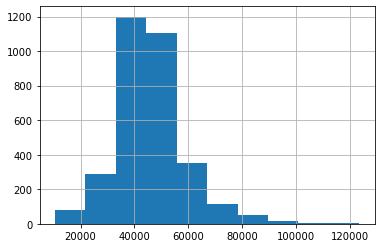

In [81]:
census['Income'].hist()

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


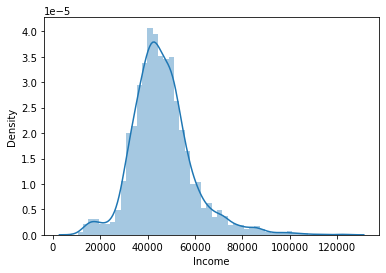

In [82]:
sns.distplot(census['Income'])
plt.show()

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Income'>

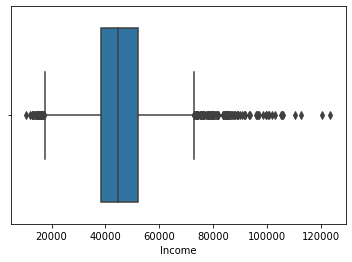

In [83]:
sns.boxplot(census['Income'])

In [84]:
from scipy import stats
stats.describe(census['Income'])

DescribeResult(nobs=3218, minmax=(10499.0, 123453.0), mean=46123.61653200746, variance=166627556.71022704, skewness=0.9800252597216413, kurtosis=2.989010027545528)

# Some Options for Standardizing Data

### Dropping Outliers

In [85]:
iqr = np.percentile(census['Income'],75) - np.percentile(census['Income'],25)
upper_limit = np.percentile(census['Income'],75) + 1.5*iqr
lower_limit = np.percentile(census['Income'],25) - 1.5*iqr

In [86]:
income_pruned = census['Income'][(census['Income']>lower_limit) & (census['Income']<upper_limit)]

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Income'>

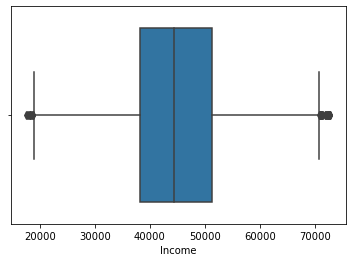

In [87]:
sns.boxplot(income_pruned)

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


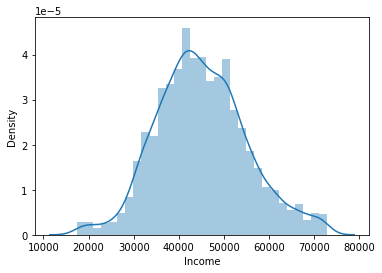

In [88]:
sns.distplot(income_pruned)
plt.show()

In [89]:
stats.describe(income_pruned)

DescribeResult(nobs=3057, minmax=(17423.0, 72807.0), mean=45077.55904481518, variance=99598221.73874097, skewness=0.2399643103433694, kurtosis=0.09000509982991556)

### Log Transformation

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


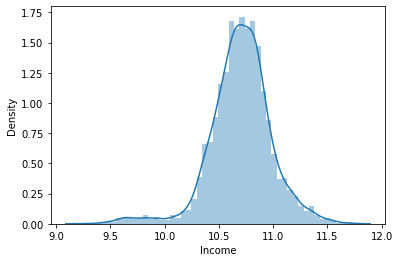

In [90]:
income_log = np.log(census['Income'])
sns.distplot(income_log)
plt.show()

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Income'>

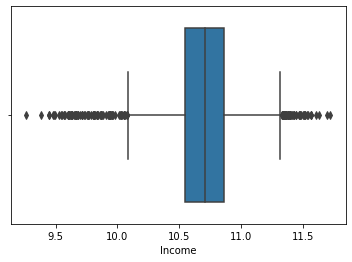

In [91]:
sns.boxplot(income_log)

In [92]:
stats.describe(income_log)

DescribeResult(nobs=3218, minmax=(9.259035293514941, 11.723615795814627), mean=10.699868546760516, variance=0.082101734377845, skewness=-0.6368038704892826, kurtosis=2.659642086931661)

### Box Cox transformation

In [93]:
help(stats.boxcox)

Help on function boxcox in module scipy.stats.morestats:

boxcox(x, lmbda=None, alpha=None)
    Return a dataset transformed by a Box-Cox power transformation.
    
    Parameters
    ----------
    x : ndarray
        Input array.  Must be positive 1-dimensional.  Must not be constant.
    lmbda : {None, scalar}, optional
        If `lmbda` is not None, do the transformation for that value.
    
        If `lmbda` is None, find the lambda that maximizes the log-likelihood
        function and return it as the second output argument.
    alpha : {None, float}, optional
        If ``alpha`` is not None, return the ``100 * (1-alpha)%`` confidence
        interval for `lmbda` as the third output argument.
        Must be between 0.0 and 1.0.
    
    Returns
    -------
    boxcox : ndarray
        Box-Cox power transformed array.
    maxlog : float, optional
        If the `lmbda` parameter is None, the second returned argument is
        the lambda that maximizes the log-likelihood func

In [94]:
income_bc, lmbda = stats.boxcox(census['Income'])
income_bc

array([210.56829028, 208.79720303, 175.05627624, ..., 135.25605397,
       127.99809011, 124.77589695])

In [95]:
stats.describe(income_bc)

DescribeResult(nobs=3218, minmax=(108.25313117480003, 303.66471853953067), mean=199.5538906500675, variance=542.4500136446337, skewness=0.07074711149069046, kurtosis=1.794840934902064)

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


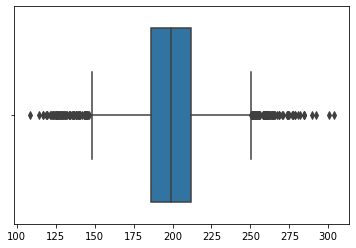

In [96]:
sns.boxplot(income_bc)
plt.show()

C:\Users\vicke\anaconda3\envs\kittycat\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


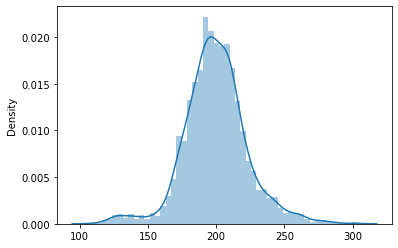

In [97]:
sns.distplot(income_bc)
plt.show() 

### Scikit Learn StandardScaler
Standard Scaler changes each *feature column*. It transforms the data to have mean 0 and standard deviation 1 (e.g. normal distribution becomes a standard normal distribution). It is often used in classification problems. StandardScaler and other scalers that work feature-wise are preferred when you are interested in the relationship between different variables (for example head length and body length of crocodiles).

In [124]:

from sklearn.preprocessing import StandardScaler
X = census.select_dtypes(include = np.number).dropna()
# Normalizing data
transformer = StandardScaler().fit(X)
pd.DataFrame(transformer.transform(X))


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,-1.865789,-0.138565,-0.141558,-0.135649,-0.436917,0.015217,0.688328,-0.182113,-0.085542,-0.182552,-0.142600,0.399598,-0.238760,0.161477,-0.268357,-0.551957,-0.478020,0.346575,-0.369657,0.621936,-0.977755,0.238490,1.090073,-0.508722,-0.285166,-0.759868,-0.186826,-0.891579,0.574999,-0.144510,-0.081324,0.519837,-0.621632,-0.633383,-0.120902,-0.707272
1,-1.865667,0.299519,0.296021,0.302818,-0.338162,0.333734,0.058063,-0.154533,-0.200496,-0.182552,0.378840,0.320025,-0.827824,0.539857,-0.623654,-0.491836,-0.426696,0.330871,-0.177057,1.529538,-0.455533,-0.789951,0.722318,-0.508722,-0.285166,-0.624686,-0.126385,-0.229682,0.557128,0.269380,0.929400,-0.812026,-0.544978,0.245447,-0.145337,-0.707272
2,-1.865544,-0.227149,-0.219720,-0.234253,-0.332964,-1.276304,2.663158,-0.209694,-0.315449,-0.182552,-0.240147,-1.019618,0.065172,-1.154696,-0.539885,1.107366,1.805875,-0.658506,-0.617287,0.277673,-0.455533,1.284362,0.604112,0.213453,-0.187107,-0.408394,-0.065944,-0.954617,0.146099,-0.247296,-0.311616,0.504350,-0.161703,-0.413675,2.322651,1.413884
3,-1.865421,-0.240702,-0.235189,-0.245956,-0.457708,-0.041505,0.891413,-0.182113,-0.430402,-0.182552,-0.255838,-0.576892,0.598881,-0.895176,0.249664,-0.083018,0.317494,-1.490838,-0.122028,-1.381049,1.490935,1.388949,0.525307,1.107575,-0.154421,-0.732831,-0.065944,-1.238287,0.986028,-0.249320,0.328083,-0.223528,-0.315013,0.245447,0.050147,1.413884
4,-1.865298,-0.130771,-0.130282,-0.131211,-0.125057,0.543170,-0.502173,-0.195903,-0.430402,-0.182552,-0.134703,-0.024067,0.152905,-0.555878,-0.626543,-0.095042,0.257617,-0.391531,-1.167574,0.528046,0.185377,0.726564,0.748587,0.316621,-0.187107,-0.651722,-0.730796,-0.733985,2.076149,-0.156513,0.993370,-0.626184,-0.953804,0.245447,-0.096466,-0.707272
5,-1.865175,-0.278047,-0.276114,-0.279845,-0.343359,-2.323483,4.343865,-0.071792,-0.392085,-0.182552,-0.301845,-1.099113,1.585354,-1.032607,0.670436,0.854860,1.215655,-1.914857,-0.919945,-0.786413,1.752046,1.859592,-0.564824,1.589026,-0.089049,0.456771,0.054938,-0.576390,0.753707,-0.278902,0.673521,-0.378396,-0.647184,-0.633383,2.420393,1.413884
6,-1.865053,-0.247748,-0.251596,-0.243983,-0.509685,-0.966513,2.460073,-0.223484,-0.315449,-0.182552,-0.265168,-1.076566,-0.551047,-0.901797,-0.620765,0.951053,1.284086,-0.548575,-0.479715,-0.097887,-0.574220,1.388949,0.696050,0.729293,-0.317852,-0.678758,-0.609914,-0.923098,0.235453,-0.252533,0.404847,-0.208042,-0.442771,-0.193968,0.685470,1.413884
7,-1.864930,0.053788,0.046884,0.060426,-0.390138,-0.106954,0.814381,-0.209694,-0.123860,-0.182552,0.090832,-0.342513,-1.004334,-0.419900,-0.837410,0.361873,0.633989,-0.579984,-0.177057,0.621936,-0.526745,0.813720,0.801123,-0.302387,-0.252480,-0.570613,-0.247267,-0.607909,0.146099,0.011884,-0.017354,0.504350,-0.749391,-0.413675,1.027568,-0.707272
8,-1.864807,-0.204769,-0.208482,-0.201145,-0.551266,-0.791984,2.214970,-0.209694,-0.162178,-0.182552,-0.212127,-0.925633,0.052639,-0.468833,0.007022,0.494138,1.113008,-1.208159,-1.057517,1.279165,-0.289371,1.510968,0.774855,0.557346,-0.252480,-0.813940,-0.730796,-0.797023,0.324807,-0.213286,1.389983,-0.842999,-1.311527,-0.633383,0.196760,1.413884
9,-1.864684,-0.230043,-0.229433,-0.230577,-0.494092,0.708973,-0.271076,-0.154533,-0.353767,-0.182552,-0.240702,-0.761452,-0.594392,-0.349327,0.189966,0.205560,0.505680,-0.265896,-0.644801,-0.849006,0.232852,1.005463,0.617246,0.626125,-0.252480,-0.732831,-0.549473,-0.670947,0.735836,-0.236890,-0.145294,0.148154,-0.008393,0.465154,-0.047595,1.413884


### Scikit Learn Normalizer

Normalizer changes each sample individually (!) and squeezes the values to be between 0 and 1.
This means that the distribution of the data at the *feature* level will change drastically. Normalizer and other scalers that work sample-wise should be preferred when you are interested in how one observation is linked to another, instead of exploring relationships between variables.

Example: when we are working with text data and are looking at the relationships between different documents, which is their topic, what are the word frequencies in each etc.

In [102]:
from sklearn.preprocessing import Normalizer
help(Normalizer)

Help on class Normalizer in module sklearn.preprocessing._data:

class Normalizer(sklearn.base.TransformerMixin, sklearn.base.BaseEstimator)
 |  Normalizer(norm='l2', *, copy=True)
 |  
 |  Normalize samples individually to unit norm.
 |  
 |  Each sample (i.e. each row of the data matrix) with at least one
 |  non zero component is rescaled independently of other samples so
 |  that its norm (l1, l2 or inf) equals one.
 |  
 |  This transformer is able to work both with dense numpy arrays and
 |  scipy.sparse matrix (use CSR format if you want to avoid the burden of
 |  a copy / conversion).
 |  
 |  Scaling inputs to unit norms is a common operation for text
 |  classification or clustering for instance. For instance the dot
 |  product of two l2-normalized TF-IDF vectors is the cosine similarity
 |  of the vectors and is the base similarity metric for the Vector
 |  Space Model commonly used by the Information Retrieval community.
 |  
 |  Read more in the :ref:`User Guide <preproce

In [103]:
X = census.select_dtypes(include = np.number)
# Normalizing data
transformer = Normalizer().fit(X)
pd.DataFrame(transformer.transform(X))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34
0,0.009975,0.550267,0.266509,0.283758,2.590852e-05,7.553331e-04,1.843491e-04,3.985927e-06,9.964816e-06,0.000000e+00,0.405817,0.511006,0.023826,0.248861,0.010762,0.000129,0.000185,0.000331,0.000169,0.000241,8.569742e-05,1.703984e-04,0.000872,8.769038e-05,9.964816e-07,4.982408e-06,1.295426e-05,1.793667e-05,0.000264,0.239016,0.000733,2.082647e-04,5.480649e-05,0.000000e+00,7.573260e-05
1,0.003351,0.651872,0.318431,0.333441,1.503387e-05,2.776254e-04,3.173817e-05,2.004516e-06,2.338602e-06,0.000000e+00,0.493428,0.167892,0.004220,0.091262,0.002375,0.000045,0.000064,0.000111,0.000059,0.000091,3.608129e-05,3.741763e-05,0.000283,2.939957e-05,3.340860e-07,3.340860e-06,4.677204e-06,1.302935e-05,0.000088,0.287157,0.000272,4.109257e-05,1.937699e-05,1.336344e-06,2.505645e-05
2,0.018431,0.493913,0.265864,0.228049,8.436060e-05,8.472738e-04,8.564435e-04,3.667852e-06,7.335704e-06,0.000000e+00,0.379879,0.604535,0.054523,0.308540,0.014635,0.000490,0.000831,0.000491,0.000295,0.000424,1.980640e-04,4.236369e-04,0.001537,1.998979e-04,7.335704e-06,3.301067e-05,2.750889e-05,2.934282e-05,0.000442,0.157663,0.001317,3.814566e-04,1.338766e-04,1.833926e-06,3.227710e-04
3,0.018392,0.412844,0.220504,0.192340,4.018126e-05,1.360683e-03,3.908540e-04,7.305683e-06,1.826421e-06,0.000000e+00,0.319532,0.706423,0.072966,0.336628,0.029551,0.000307,0.000510,0.000393,0.000327,0.000325,3.470199e-04,4.328617e-04,0.001520,2.465668e-04,9.132104e-06,1.095852e-05,2.739631e-05,1.278494e-05,0.000526,0.151483,0.001403,2.940537e-04,1.223702e-04,7.305683e-06,1.515929e-04
4,0.010186,0.582568,0.287822,0.294747,8.681486e-05,8.873286e-04,1.514213e-05,3.028425e-06,1.009475e-06,0.000000e+00,0.427462,0.462471,0.031708,0.207265,0.007147,0.000169,0.000275,0.000288,0.000142,0.000241,1.362791e-04,2.008855e-04,0.000857,1.130612e-04,4.037900e-06,9.085276e-06,4.037900e-06,2.321793e-05,0.000352,0.223992,0.000828,1.362791e-04,4.239795e-05,4.037900e-06,7.772958e-05
5,0.025118,0.265291,0.140621,0.124670,1.093165e-04,5.515513e-04,1.756517e-03,2.981359e-05,4.968931e-06,0.000000e+00,0.200173,0.793489,0.146186,0.436769,0.051056,0.000611,0.000954,0.000467,0.000373,0.000489,4.993776e-04,6.558989e-04,0.001861,3.701854e-04,1.739126e-05,1.242233e-04,4.223591e-05,6.956503e-05,0.000683,0.096025,0.001975,3.751543e-04,1.341611e-04,0.000000e+00,4.472038e-04
6,0.021087,0.423690,0.197794,0.225896,2.497928e-05,1.109496e-03,9.117436e-04,2.081606e-06,8.326425e-06,0.000000e+00,0.324335,0.670881,0.037323,0.382807,0.014863,0.000529,0.000816,0.000572,0.000346,0.000456,2.144055e-04,4.933407e-04,0.001759,2.581192e-04,0.000000e+00,1.665285e-05,1.248964e-05,3.538731e-05,0.000512,0.162636,0.001611,3.372202e-04,1.290596e-04,4.163213e-06,2.268951e-04
7,0.005612,0.644911,0.311122,0.333789,1.935042e-05,4.035946e-04,1.122325e-04,1.105739e-06,4.975823e-06,0.000000e+00,0.489909,0.230563,0.005114,0.118170,0.002704,0.000113,0.000175,0.000151,0.000098,0.000134,5.805127e-05,1.127853e-04,0.000472,5.196971e-05,1.105739e-06,6.634431e-06,6.634431e-06,1.492747e-05,0.000133,0.262066,0.000410,1.149968e-04,2.764346e-05,5.528693e-07,6.800292e-05
8,0.015592,0.522466,0.249252,0.273214,6.132409e-06,8.784676e-04,6.178402e-04,3.066204e-06,1.226482e-05,0.000000e+00,0.405690,0.523968,0.045211,0.323040,0.020942,0.000331,0.000570,0.000357,0.000222,0.000403,1.763068e-04,3.740769e-04,0.001305,1.824392e-04,3.066204e-06,4.599307e-06,6.132409e-06,3.219515e-05,0.000385,0.209866,0.001305,1.855054e-04,4.292686e-05,0.000000e+00,1.364461e-04
9,0.017628,0.449912,0.224454,0.225457,2.594846e-05,1.586316e-03,8.303506e-05,1.037938e-05,5.189691e-06,0.000000e+00,0.356359,0.627883,0.029581,0.377308,0.026917,0.000332,0.000521,0.000507,0.000277,0.000337,2.369959e-04,3.719279e-04,0.001451,2.093176e-04,3.459794e-06,1.037938e-05,1.210928e-05,4.324743e-05,0.000474,0.175671,0.001265,3.200310e-04,1.366619e-04,8.649486e-06,1.366619e-04


### Other options: Creating a categorical variable out of a numerical one

In [104]:
# equal distribution in width
census['IncomeRange'] = pd.cut(census.Income, 3) 
census.IncomeRange.value_counts()

(10386.046, 48150.333]    1984
(48150.333, 85801.667]    1193
(85801.667, 123453.0]       41
Name: IncomeRange, dtype: int64

In [105]:
# equal distribution in bucket 
census['IncomePercentile'] = pd.qcut(census.Income, [0, 0.3333, 0.6666, 1])
census.IncomePercentile.value_counts()

(10498.999, 40630.0]     1074
(49733.809, 123453.0]    1073
(40630.0, 49733.809]     1071
Name: IncomePercentile, dtype: int64

In [106]:
census['HighUnemploymentLowIncome'] = np.where((census.Unemployment > 0.07) & (census.IncomePercentile.cat.codes == 0), 1, 0) 
census.HighUnemploymentLowIncome.value_counts()

0    2145
1    1073
Name: HighUnemploymentLowIncome, dtype: int64

### Checking Correlations

<AxesSubplot:>

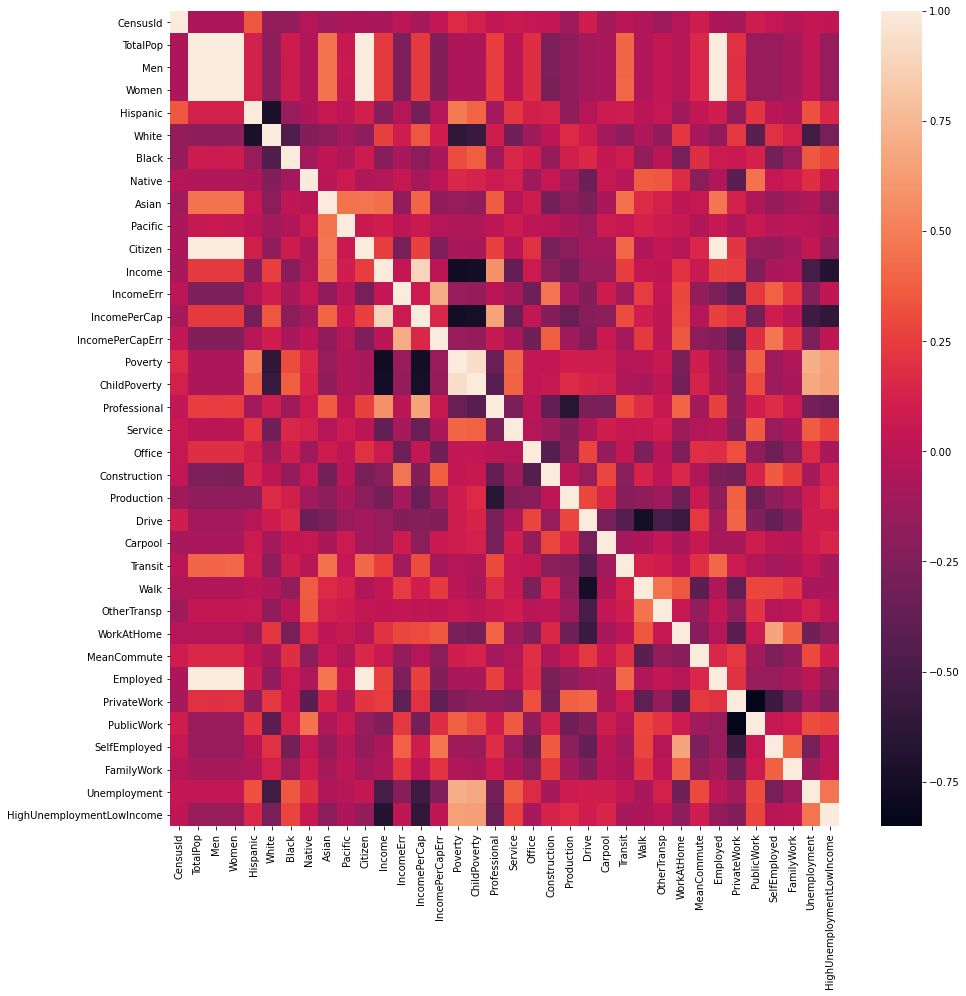

In [107]:
plt.figure(figsize=(15,15))
sns.heatmap(census.corr())

Features with high correlation:
- TotalPop, Men and Women, and Citizen and Employed
- Poverty and ChildPoverty
Remember: we want high correlation with the target variable, but low correlation of the features to one another!

### Encoding Categorical Variables

In [108]:
# extracting only categorical variables
cat = census.select_dtypes(include = 'object')
print(cat.columns)

Index(['State', 'County'], dtype='object')


In [109]:
cat['State'].value_counts()

Texas                   253
Georgia                 159
Virginia                133
Kentucky                120
Missouri                115
Kansas                  105
Illinois                102
North Carolina          100
Iowa                     99
Tennessee                95
Nebraska                 93
Indiana                  92
Ohio                     88
Minnesota                87
Michigan                 83
Mississippi              82
Puerto Rico              78
Oklahoma                 77
Arkansas                 75
Wisconsin                72
Alabama                  67
Pennsylvania             67
Florida                  67
South Dakota             66
Colorado                 64
Louisiana                64
New York                 62
California               58
Montana                  56
West Virginia            55
North Dakota             53
South Carolina           46
Idaho                    44
Washington               39
Oregon                   36
New Mexico          

#### LabelEncoder

In [110]:
# encoding one variable at a time
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit_transform(cat['State'])

array([ 0,  0,  0, ..., 39, 39, 39])

In [111]:
print(le.classes_)
print(le.transform(le.classes_))
dict(zip(le.classes_, le.transform(le.classes_)))

['Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California' 'Colorado'
 'Connecticut' 'Delaware' 'District of Columbia' 'Florida' 'Georgia'
 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas' 'Kentucky'
 'Louisiana' 'Maine' 'Maryland' 'Massachusetts' 'Michigan' 'Minnesota'
 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada' 'New Hampshire'
 'New Jersey' 'New Mexico' 'New York' 'North Carolina' 'North Dakota'
 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Puerto Rico' 'Rhode Island'
 'South Carolina' 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont'
 'Virginia' 'Washington' 'West Virginia' 'Wisconsin' 'Wyoming']
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51]


{'Alabama': 0,
 'Alaska': 1,
 'Arizona': 2,
 'Arkansas': 3,
 'California': 4,
 'Colorado': 5,
 'Connecticut': 6,
 'Delaware': 7,
 'District of Columbia': 8,
 'Florida': 9,
 'Georgia': 10,
 'Hawaii': 11,
 'Idaho': 12,
 'Illinois': 13,
 'Indiana': 14,
 'Iowa': 15,
 'Kansas': 16,
 'Kentucky': 17,
 'Louisiana': 18,
 'Maine': 19,
 'Maryland': 20,
 'Massachusetts': 21,
 'Michigan': 22,
 'Minnesota': 23,
 'Mississippi': 24,
 'Missouri': 25,
 'Montana': 26,
 'Nebraska': 27,
 'Nevada': 28,
 'New Hampshire': 29,
 'New Jersey': 30,
 'New Mexico': 31,
 'New York': 32,
 'North Carolina': 33,
 'North Dakota': 34,
 'Ohio': 35,
 'Oklahoma': 36,
 'Oregon': 37,
 'Pennsylvania': 38,
 'Puerto Rico': 39,
 'Rhode Island': 40,
 'South Carolina': 41,
 'South Dakota': 42,
 'Tennessee': 43,
 'Texas': 44,
 'Utah': 45,
 'Vermont': 46,
 'Virginia': 47,
 'Washington': 48,
 'West Virginia': 49,
 'Wisconsin': 50,
 'Wyoming': 51}

In [112]:
print(le.transform(['Wyoming']))
print(le.inverse_transform([51]))

[51]
['Wyoming']


The **LabelEncoding** method will create a column which contains all the numerical values, where each number is mapped to a certain category. ML models will be able to deal with this, since now we are looking at a numerical column - on the down side, algorithms might interpret it as a numerical (linear) variable instead of a categorical. Another approach is OneHotEncoding, which will gives us dummies for each variable separately.

#### OneHotEncoding

In [113]:
from sklearn.preprocessing import OneHotEncoder
# OneHotEncoder() transform several variables together. works like pd.get dummy

enc = OneHotEncoder()

enc_df = pd.DataFrame(enc.fit_transform(cat).toarray())

In [114]:
enc_df.head()

0     1     2     3     4     5     6     7     8     9     10    11    \
0   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   12    13    14    15    16    17    18    19    20    21    22    23    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   24    25    26    27    28    29    30    31    32    33    34    35    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   36    37    38    39    40    41    42    43    44    45    46    47    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   48    49    50    51    52    53    54    55    56    57    58    59    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   60    61    62    63    64    65    66    67    68    69    70    71    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   72    73    74    75    76    77    78    79    80    81    82    83    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   84    85    86    87    88    89    90    91    92    93    94    95    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   

   96    97    98    99    100   101   102   103   104   105   106   107   \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0 

In [116]:
# onehotencoding transforms several columns while labelencoder works on work column and
enc_df.sum(axis = 1)

0       2.0
1       2.0
2       2.0
3       2.0
4       2.0
5       2.0
6       2.0
7       2.0
8       2.0
9       2.0
10      2.0
11      2.0
12      2.0
13      2.0
14      2.0
15      2.0
16      2.0
17      2.0
18      2.0
19      2.0
20      2.0
21      2.0
22      2.0
23      2.0
24      2.0
25      2.0
26      2.0
27      2.0
28      2.0
29      2.0
30      2.0
31      2.0
32      2.0
33      2.0
34      2.0
35      2.0
36      2.0
37      2.0
38      2.0
39      2.0
40      2.0
41      2.0
42      2.0
43      2.0
44      2.0
45      2.0
46      2.0
47      2.0
48      2.0
49      2.0
50      2.0
51      2.0
52      2.0
53      2.0
54      2.0
55      2.0
56      2.0
57      2.0
58      2.0
59      2.0
60      2.0
61      2.0
62      2.0
63      2.0
64      2.0
65      2.0
66      2.0
67      2.0
68      2.0
69      2.0
70      2.0
71      2.0
72      2.0
73      2.0
74      2.0
75      2.0
76      2.0
77      2.0
78      2.0
79      2.0
80      2.0
81      2.0
82      2.0
83  

In [117]:
# merge with main df bridge_df on key values
cat = cat.join(enc_df)
cat.head()

State   County    0    1    2    3    4    5    6    7    8    9   10  \
0  Alabama  Autauga  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  Alabama  Baldwin  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  Alabama  Barbour  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  Alabama     Bibb  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  Alabama   Blount  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    11   12   13   14   15   16   17   18   19   20   21   22   23   24   25  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    26   27   28   29   30   31   32   33   34   35   36   37   38   39   40  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    41   42   43   44   45   46   47   48   49   50   51   52   53   54   55  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    56   57   58   59   60   61   62   63   64   65   66   67   68   69   70  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    71   72   73   74   75   76   77   78   79   80   81   82   83   84   85  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    86   87   88   89   90   91   92   93   94   95   96   97   98   99  100  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

   101  102  103  104  105  106  107  108  109  110  111  112  113  114  115  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

   116  117  118  119  120  121  122  123  124  125  126  127  128  129  130  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0

#### Get Dummies

In [118]:
pd.get_dummies(cat, columns=['State'])

### Storing models, encodings etc: Pickle

In [119]:
import pickle
# to store trained procedure, then read your pickle anytime.
pickle.dump(enc, open('encoding_state.pkl','wb'))
# Pickle module uses binary protocol (wb stands for write binary)

In [ ]:
help(pickle.dump)

In [ ]:
model = pickle.load(open('encoding_state.pkl','rb'))

In [ ]:
model

In [ ]:
model.fit_transform(cat)